# Install Dependencies
Choose GPU in Runtime if not already Selected.\
Runtime -> Change Runtime Type -> Hardware accelerator -> GPU

In [2]:
!nvidia-smi

Sat Oct 26 04:30:24 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   47C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [3]:
# clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5.git
%cd yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 17022, done.
remote: Total 17022 (delta 0), reused 0 (delta 0), pack-reused 17022 (from 1)
Receiving objects: 100% (17022/17022), 15.61 MiB | 15.19 MiB/s, done.
Resolving deltas: 100% (11690/11690), done.
/content/yolov5


In [4]:
%pwd

'/content/yolov5'

In [5]:
# install dependencies as necessary
!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images
# from utils.google_utils import gdrive_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 877.6/877.6 kB 20.2 MB/s eta 0:00:00
Setup complete. Using torch 2.5.0+cu121 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15102MB, multi_processor_count=40, uuid=e2e38ad9-5bf3-ff93-704f-4b1eb5b6eeed, L2_cache_size=4MB)


# Our Custom Data

In [6]:
pwd

'/content/yolov5'

In [7]:
# Export code snippet and paste here
%cd /content
!curl -L "https://github.com/ssmaheswar2001/Sign-Language-Detection-using-YOLOv5/raw/main/Sign_language_data.zip" > SignData.zip; unzip SignData.zip; rm SignData.zip


/content
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100 4680k  100 4680k    0     0  3562k      0  0:00:01  0:00:01 --:--:-- 26.7M
Archive:  SignData.zip
   creating: test/
   creating: test/images/
  inflating: test/images/Hello-2b499fd8-9187-11ef-88e3-9078418c2656_jpg.rf.b97e48de4054079446429f73bb5aca24.jpg  
  inflating: test/images/Hello-891d0dac-9221-11ef-a0db-9078418c2656_jpg.rf.b390061e5d2162d2d43e10eeec0fed8d.jpg  
  inflating: test/images/Hello-d38ccc52-9222-11ef-80ad-9078418c2656_jpg.rf.e025f0ca26f477a87c0f7d16a79b17e7.jpg  
  inflating: test/images/Hello-eebbb002-9220-11ef-bef9-9078418c2656_jpg.rf.3432be43272dfb46d0b6b397b168879d.jpg  
  inflating: test/images/Hello-eff2ba38-9220-11ef-a262-9078418c2656_jpg.rf.c284eeab02d1913ed4b8ef6346ada60f.jpg  
  inflating: test/images/Hello-f129da

In [8]:
# This is the YAML file we're loading into this notebook with out data
%cat data.yaml

train: ../train/images
test: ../test/images

nc: 6
names: ['Hello', 'IloveYou', 'No', 'Please', 'Thanks', 'Yes']


# Define Model Configuration and Architecture
- We will write a yaml script that defines tha parameters for our model like the number of classes, achors, and each layer.

In [10]:
# define number of classes based on YAML
import yaml
with open("data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [11]:
num_classes

'6'

In [12]:
# This is the model configuration we will use
%cat /content/yolov5/models/yolov5s.yaml

# Ultralytics YOLOv5 🚀, AGPL-3.0 license

# Parameters
nc: 80 # number of classes
depth_multiple: 0.33 # model depth multiple
width_multiple: 0.50 # layer channel multiple
anchors:
  - [10, 13, 16, 30, 33, 23] # P3/8
  - [30, 61, 62, 45, 59, 119] # P4/16
  - [116, 90, 156, 198, 373, 326] # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [
    [-1, 1, Conv, [64, 6, 2, 2]], # 0-P1/2
    [-1, 1, Conv, [128, 3, 2]], # 1-P2/4
    [-1, 3, C3, [128]],
    [-1, 1, Conv, [256, 3, 2]], # 3-P3/8
    [-1, 6, C3, [256]],
    [-1, 1, Conv, [512, 3, 2]], # 5-P4/16
    [-1, 9, C3, [512]],
    [-1, 1, Conv, [1024, 3, 2]], # 7-P5/32
    [-1, 3, C3, [1024]],
    [-1, 1, SPPF, [1024, 5]], # 9
  ]

# YOLOv5 v6.0 head
head: [
    [-1, 1, Conv, [512, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 6], 1, Concat, [1]], # cat backbone P4
    [-1, 3, C3, [512, False]], # 13

    [-1, 1, Conv, [256, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 4],

In [13]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [19]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# Ultralytics YOLOv5 🚀, AGPL-3.0 license

# Parameters
nc: 80 # number of classes
depth_multiple: 0.33 # model depth multiple
width_multiple: 0.50 # layer channel multiple
anchors:
  - [10, 13, 16, 30, 33, 23] # P3/8
  - [30, 61, 62, 45, 59, 119] # P4/16
  - [116, 90, 156, 198, 373, 326] # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [
    [-1, 1, Conv, [64, 6, 2, 2]], # 0-P1/2
    [-1, 1, Conv, [128, 3, 2]], # 1-P2/4
    [-1, 3, C3, [128]],
    [-1, 1, Conv, [256, 3, 2]], # 3-P3/8
    [-1, 6, C3, [256]],
    [-1, 1, Conv, [512, 3, 2]], # 5-P4/16
    [-1, 9, C3, [512]],
    [-1, 1, Conv, [1024, 3, 2]], # 7-P5/32
    [-1, 3, C3, [1024]],
    [-1, 1, SPPF, [1024, 5]], # 9
  ]

# YOLOv5 v6.0 head
head: [
    [-1, 1, Conv, [512, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 6], 1, Concat, [1]], # cat backbone P4
    [-1, 3, C3, [512, False]], # 13

    [-1, 1, Conv, [256, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 4], 1, Concat, [1]], # cat backbone P3
    [-1, 3, C3, [256, False]], # 17 (P3/8-small)

    [-1, 1, Conv, [256, 3, 2]],
    [[-1, 14], 1, Concat, [1]], # cat head P4
    [-1, 3, C3, [512, False]], # 20 (P4/16-medium)

    [-1, 1, Conv, [512, 3, 2]],
    [[-1, 10], 1, Concat, [1]], # cat head P5
    [-1, 3, C3, [1024, False]], # 23 (P5/32-large)

    [[17, 20, 23], 1, Detect, [nc, anchors]], # Detect(P3, P4, P5)
  ]


# Train Custom YOLOv5 Detector
### We'll fire off training !
Here, we are able to pass a number of arguments:
- img : define input image size
- batch : determine batch size
- epochs : define the number of training epochs. (3000+ is common here)
- data : set the path to our yaml file
- cfg : specify our model configuration
- weights : specify a custom path to weights (We can donload the Ultralytic Google Drive folder)
- name : result names
- nosave : only save the final checkpoint
- cache : cache images for faster training.

In [21]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 300 --data '../data.yaml' --cfg ./models/custom_yolov5s.yaml --weights 'yolov5s.pt' --name yolov5s_results  --cache

Streaming output truncated to the last 5000 lines.
     85/299      1.98G    0.02851   0.008129   0.009181         26        416:  44% 4/9 [00:00<00:00,  6.61it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
     85/299      1.98G    0.02903   0.008011   0.008934         27        416:  56% 5/9 [00:00<00:00,  6.49it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
     85/299      1.98G    0.02804   0.007866   0.008975         27        416:  67% 6/9 [00:00<00:00,  6.80it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
     85/299      1.98G    0.02784   0.00806

# Evalute Custome YOLOv5 Detector Performance
- Training losses and performance metrics are saved to Tensorboard and also to a logfile defined above with the --name flag when we train. In our case, we named this yolov5_results. (If given no name, it defaults to results.txt) The results file is plotted as a png after training completes.

In [22]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

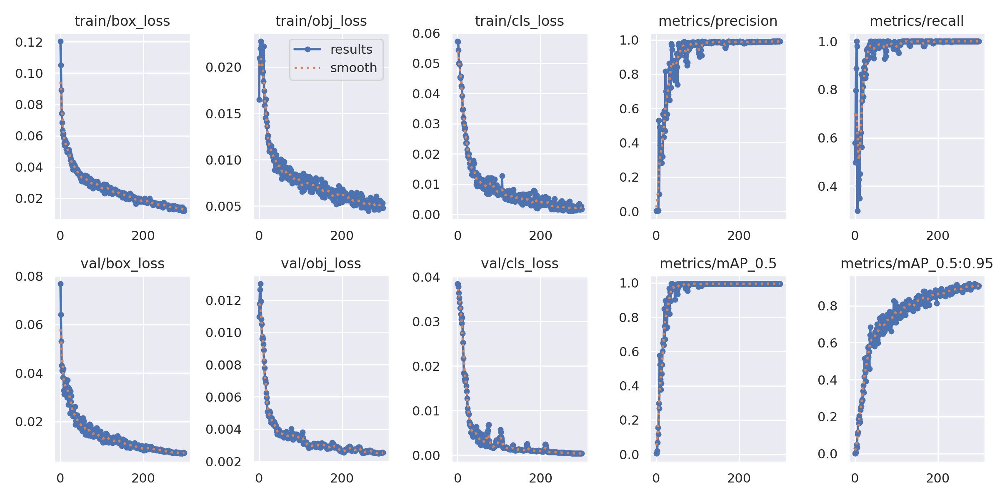

In [24]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason...
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5s_results5/results.png', width=1000)  # view results.png

# Visualize our Training Data with Labels

GROUND TRUTH TRAINING DATA


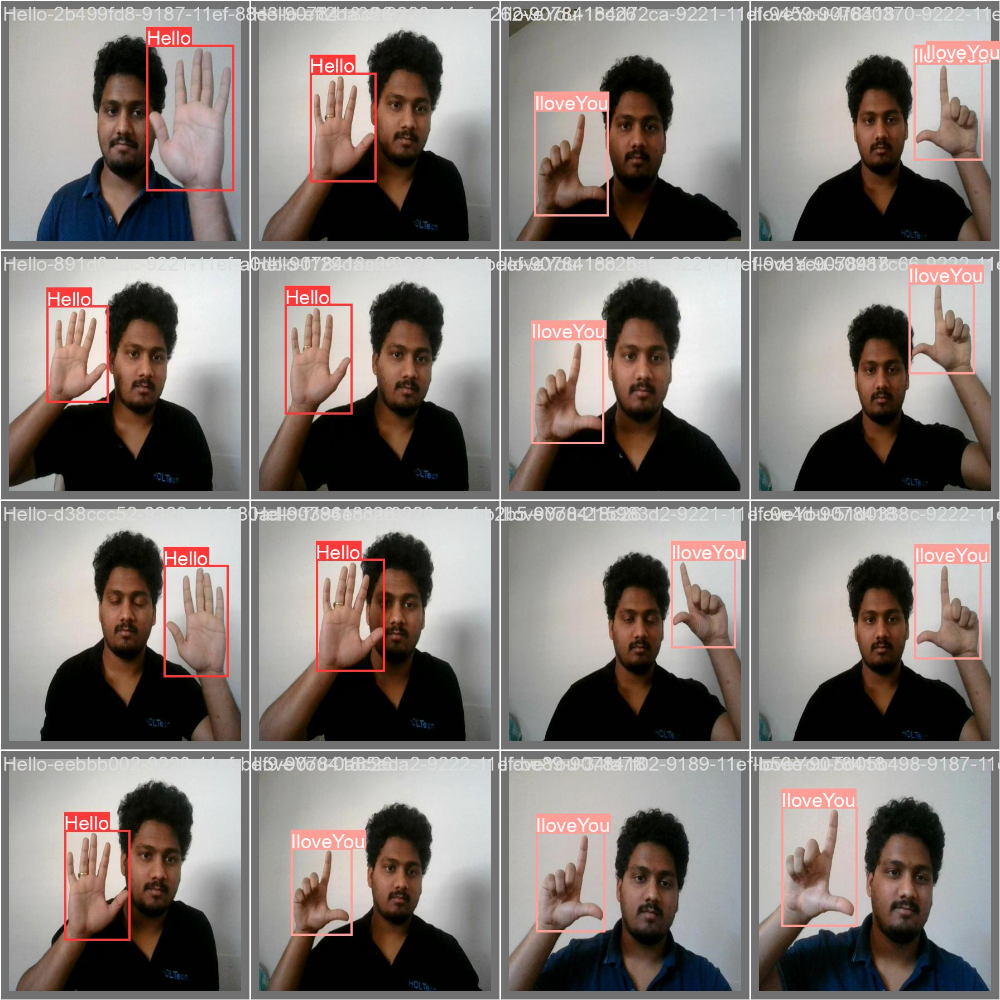

In [25]:
# First, display our ground truth data
print("GROUND TRUTH TRAINING DATA")
Image(filename='/content/yolov5/runs/train/yolov5s_results5/val_batch0_labels.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA : 


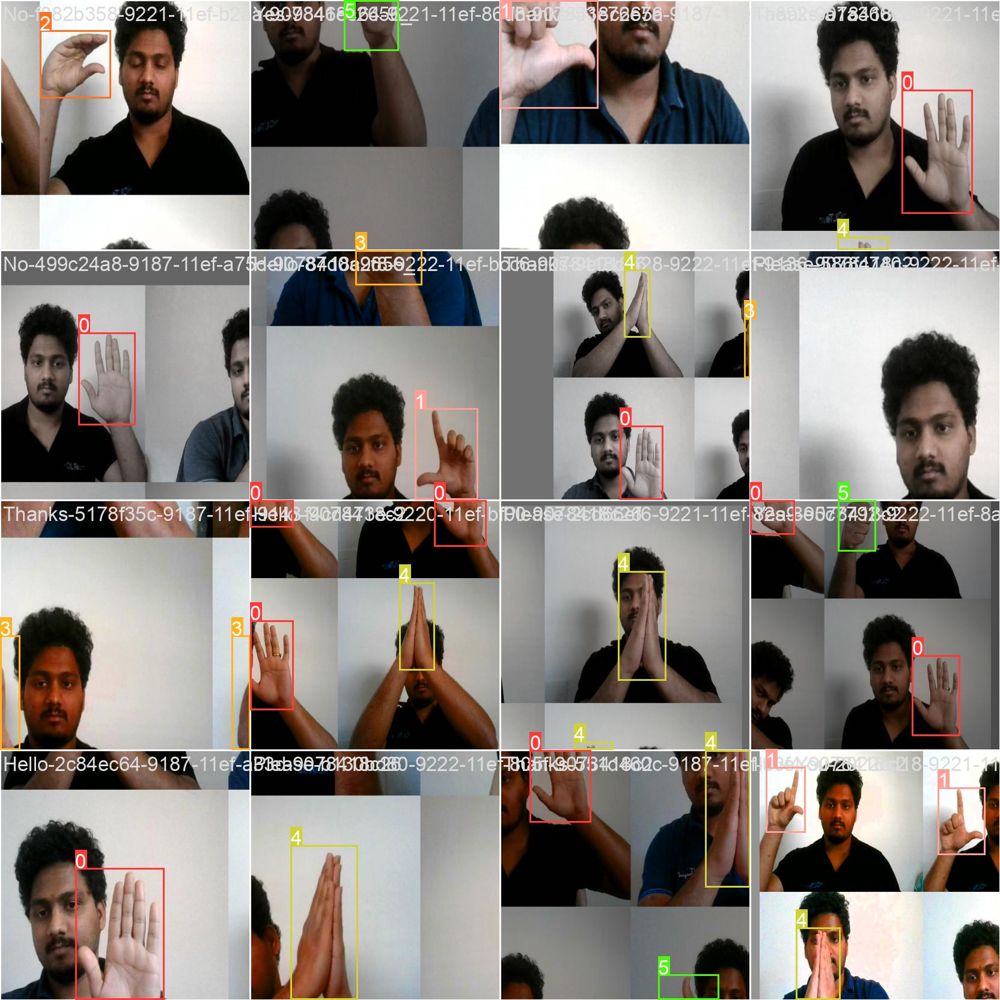

In [26]:
# Print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA : ")
Image(filename='/content/yolov5/runs/train/yolov5s_results5/train_batch0.jpg', width=900)

# Run Inference with Trained Weights
- Run inference with a pretrained checkpoint on contents of test/images folder downloded from Roboflow

In [27]:
# train weights are saved by default in our weight folder
%ls runs/

train/


In [29]:
%ls runs/train/yolov5s_results5/weights

best.pt  last.pt


In [30]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_results5/weights/best.pt --img 416 --conf 0.5 --source ../test/images

/content/yolov5
detect: weights=['runs/train/yolov5s_results5/weights/best.pt'], source=../test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-378-g2f74455a Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5s summary: 157 layers, 7026307 parameters, 0 gradients, 15.8 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/45 /content/test/images/Hello-2b499fd8-9187-11ef-88e3-9078418c2656_jpg.rf.b97e48de4054079446429f73bb5aca24.jpg: 416x416 1 Hello, 9.6ms
image 2/45 /content/test/images/Hello-891d0dac-9221-11ef-a0db-9078418c2656_jpg.rf.b390061e5d2162d

# Export Trained Weights for Future Inference
- Now that we have trained our custom detector, we can export the trained weights we have made for inference on our device elsewhere.

In [31]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [34]:
%cp /content/yolov5/runs/train/yolov5s_results5/weights/best.pt /content/gdrive/MyDrive/Research/SignLanguageDetection/model
